# Read and Visualize .aedat4 File using dv-processing

This notebook demonstrates how to read an `.aedat4` file, inspect its metadata, and visualize the event stream and frames.

In [1]:
import dv_processing as dv
import cv2 as cv
import numpy as np
from datetime import timedelta
import os

In [2]:
# Define the path to the aedat4 file
marvin_file_path = "data/marvin_dvSave-2025_11_27_12_37_39.aedat4"
yannes_file_path = "data/Yannes_dvSave-2025_11_27_12_36_22.aedat4"
zaid_file_path = "data/zaid_dvSave-2025_11_27_12_39_38.aedat4"
file_path = marvin_file_path

# Check if file exists
if not os.path.exists(file_path):
    print(f"File not found: {file_path}")
else:
    print(f"File found: {file_path}")


File found: data/marvin_dvSave-2025_11_27_12_37_39.aedat4


In [3]:
# Get camera information
reader = dv.io.MonoCameraRecording(file_path)
camera_name = reader.getCameraName()
resolution = reader.getEventResolution()

print(f"Camera: {camera_name}")
print(f"Resolution: {resolution}")

# Check for streams
if reader.isEventStreamAvailable():
    print("Event stream available")
if reader.isFrameStreamAvailable():
    print("Frame stream available")



Camera: DAVIS346_00001088
Resolution: (346, 260)
Event stream available
Frame stream available


In [4]:
from event_types import dv_store_to_numpy
# Initialisierung

reader = dv.io.MonoCameraRecording(file_path)

# Wir sammeln NumPy Arrays statt Objekte.
# Das ist speicherschonender, aber bei riesigen Files immer noch vorsichtig sein.
numpy_batches = [] 
total_events_count = 0

print("Starting to read and convert all events...")

while reader.isRunning():
    # Holt den nächsten Batch direkt als EventStore
    events_store = reader.getNextEventBatch()
    
    if events_store is not None and events_store.size() > 0:
        # Hier ist der magische Tausch:
        # Anstatt convert_dv_batch_to_custom -> dv_store_to_numpy
        events_arr = dv_store_to_numpy(events_store)
        
        numpy_batches.append(events_arr)
        total_events_count += len(events_arr)
        
        # Optional: Fortschrittsanzeige
        if len(numpy_batches) % 100 == 0:
            print(f"Processed {len(numpy_batches)} batches...")

print(f"Finished reading.")
print(f"Total batches: {len(numpy_batches)}")
print(f"Total events: {total_events_count}")

# Analyse am Ende
if len(numpy_batches) > 0:
    # 1. Wir können alles zu einem einzigen großen Array zusammenfügen (optional)
    # Das macht die weitere Verarbeitung (Slicing, Plotting) extrem einfach.
    full_stream = np.concatenate(numpy_batches)
    
    first_timestamp = full_stream['t'][0]
    last_timestamp = full_stream['t'][-1]
    
    print(f"First timestamp: {first_timestamp}")
    print(f"Last timestamp: {last_timestamp}")
    
    duration_us = last_timestamp - first_timestamp
    duration = timedelta(microseconds=float(duration_us)) # cast zu float für timedelta sicherheit
    print(f"Duration: {duration}")

    # Beispiel: Zugriff auf das allererste Event (extrem schnell)
    print(f"First event data: {full_stream[0]}")
    
    # Beispiel: Visualisierung des ersten Batches (falls du die Funktion von vorhin nutzt)
    # visualize_time_surface_numpy(numpy_batches[0])

Starting to read and convert all events...
Processed 100 batches...
Processed 200 batches...
Processed 300 batches...
Processed 400 batches...
Processed 500 batches...
Processed 600 batches...
Processed 700 batches...
Processed 800 batches...
Processed 900 batches...
Processed 1000 batches...
Processed 1100 batches...
Processed 1200 batches...
Processed 1300 batches...
Processed 1400 batches...
Processed 1500 batches...
Processed 1600 batches...
Processed 1700 batches...
Processed 1800 batches...
Processed 1900 batches...
Processed 2000 batches...
Processed 2100 batches...
Processed 2200 batches...
Processed 2300 batches...
Processed 2400 batches...
Processed 2500 batches...
Processed 2600 batches...
Processed 2700 batches...
Processed 2800 batches...
Processed 2900 batches...
Processed 3000 batches...
Processed 3100 batches...
Processed 3200 batches...
Processed 3300 batches...
Processed 3400 batches...
Processed 3500 batches...
Processed 3600 batches...
Processed 3700 batches...
Proc

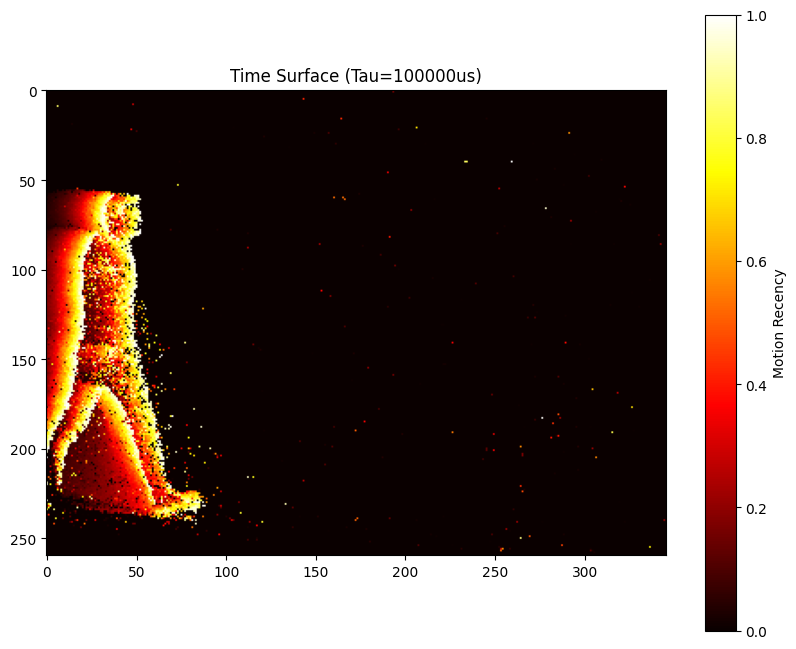

In [5]:
import matplotlib.pyplot as plt
import numpy as np

def plot_time_surface(events, width=346, height=260, tau=100000):
    """
    events: Dein NumPy Structured Array (ein Slice, z.B. 50ms)
    tau: Zerfallszeit in Mikrosekunden (30ms = 30000us ist gut für Laufbewegungen)
    """
    # 1. Letzter Zeitstempel im Slice
    if len(events) == 0:
        print("Keine Events im Slice!")
        return
        
    t_end = events['t'][-1]
    
    # 2. Grid initialisieren
    # Wir speichern den Zeitstempel des letzten Events pro Pixel
    last_timestamps = np.zeros((height, width), dtype=np.int64)
    
    # NumPy Magic: Spätere Events überschreiben frühere an der gleichen Koordinate
    # Das ist extrem schnell.
    last_timestamps[events['y'], events['x']] = events['t']
    
    # 3. Exponential Decay berechnen
    # Formel: wert = exp( - (t_jetzt - t_letztes_event) / tau )
    delta_t = t_end - last_timestamps
    surface = np.exp(-delta_t / tau)
    
    # Pixel ohne Events (wo timestamp 0 war) bereinigen
    # (Da t_end sehr groß ist, ist delta_t riesig -> exp ist eh fast 0, aber sauberer so:)
    surface[last_timestamps == 0] = 0
    
    plt.figure(figsize=(10, 8))
    plt.imshow(surface, cmap='hot', vmin=0, vmax=1)
    plt.colorbar(label="Motion Recency")
    plt.title(f"Time Surface (Tau={tau}us)")
    plt.show()
# Beispiel: Plotten des Time Surface für die ersten 50ms
plot_time_surface(full_stream [full_stream['t'] < full_stream['t'][40000] + 70000])

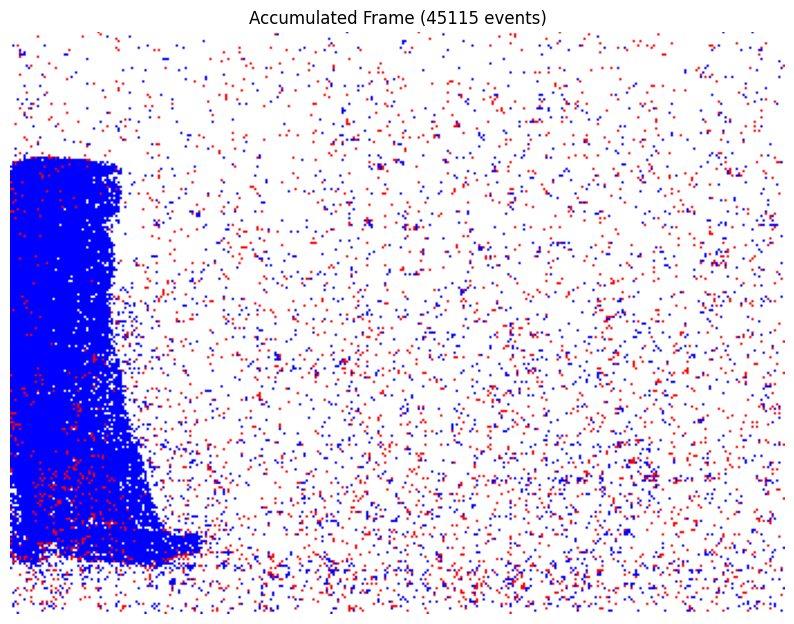

In [6]:
def plot_accumulation(events, width=346, height=260):
    # Weißer Hintergrund
    img = np.full((height, width, 3), 255, dtype=np.uint8)
    
    # Masken für Polarität
    pos = events[events['p'] == 1]
    neg = events[events['p'] == 0]
    
    # Positive Events = Rot
    img[pos['y'], pos['x']] = [255, 0, 0]
    
    # Negative Events = Blau
    img[neg['y'], neg['x']] = [0, 0, 255]
    
    plt.figure(figsize=(10, 8))
    plt.imshow(img)
    plt.title(f"Accumulated Frame ({len(events)} events)")
    plt.axis('off')
    plt.show()

# Beispiel: Plotten des akkumulierten Frames für die ersten 50ms
plot_accumulation(full_stream [full_stream['t'] < full_stream['t'][40000] + 41000])

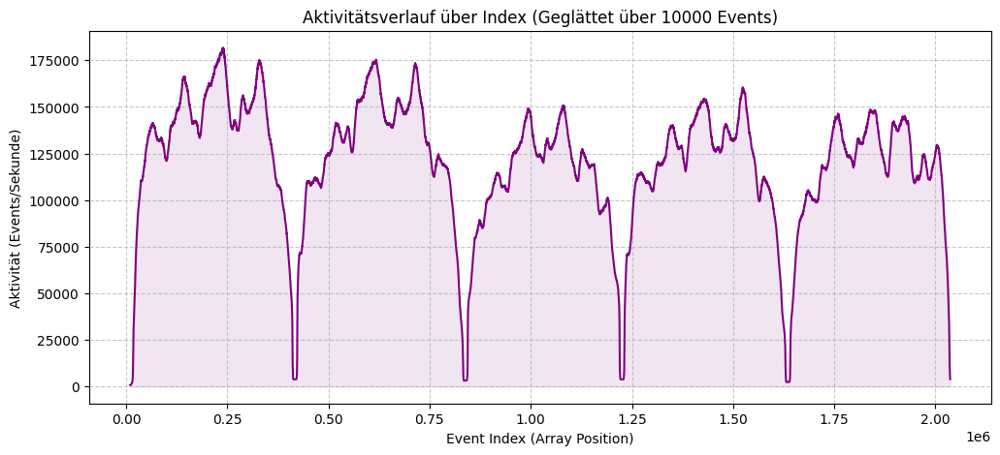

In [7]:
import matplotlib.pyplot as plt
import numpy as np

def plot_activity_by_index(full_stream, window_size=5000):
    """
    Zeigt die Event-Rate (Events pro Sekunde) auf der Y-Achse,
    aber aufgetragen gegen den Event-Index auf der X-Achse.
    
    window_size: Über wie viele Events wir den Durchschnitt berechnen.
                 Kleiner = zappelig, Größer = glatter.
    """
    timestamps = full_stream['t']
    
    # Sicherheitshalber checken, ob genug Events da sind
    if len(timestamps) < window_size:
        print("Zu wenige Events für diesen Window-Size!")
        return

    # Wir berechnen die Zeitdifferenz für das Fenster.
    # Trick: Wir subtrahieren das Array verschoben voneinander.
    # Zeitdauer für 'window_size' Events = t[i + window] - t[i]
    duration_us = timestamps[window_size:] - timestamps[:-window_size]
    
    # Vermeide Division durch Null (falls Timestamps identisch sind)
    duration_us[duration_us == 0] = 1
    
    # Umrechnung in Sekunden
    duration_s = duration_us / 1e6
    
    # Rate berechnen: Anzahl Events (window_size) / Dauer (s)
    events_per_sec = window_size / duration_s
    
    # X-Achse erstellen (Indizes passend zum Plot)
    # Wir starten bei window_size, da wir die ersten paar für die Diff brauchen
    x_indices = np.arange(window_size, len(timestamps))
    
    plt.figure(figsize=(12, 5))
    
    # Wir plotten nur jeden 100. Punkt, damit Matplotlib schnell bleibt
    step = 100
    plt.plot(x_indices[::step], events_per_sec[::step], color='purple')
    
    plt.xlabel("Event Index (Array Position)")
    plt.ylabel("Aktivität (Events/Sekunde)")
    plt.title(f"Aktivitätsverlauf über Index (Geglättet über {window_size} Events)")
    plt.grid(True, which='both', linestyle='--', alpha=0.7)
    
    # Fülle den Bereich unter der Kurve für bessere Lesbarkeit
    plt.fill_between(x_indices[::step], events_per_sec[::step], color='purple', alpha=0.1)
    
    plt.show()
# Beispiel: Plotten der Aktivität über Index
plot_activity_by_index(full_stream, window_size=10000)

In [8]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

def animate_events(full_stream, start_index=0, duration_ms=1000, slice_ms=30):
    """
    Erstellt eine Animation über eine bestimmte Dauer.
    slice_ms: Wie viele ms pro Frame gesammelt werden (Frame-Dauer)
    """
    width, height = 346, 260
    
    # Zeitbereich definieren
    start_t = full_stream['t'][start_index]
    end_t = start_t + (duration_ms * 1000)
    
    # Daten auf den Bereich zuschneiden
    subset = full_stream[(full_stream['t'] >= start_t) & (full_stream['t'] < end_t)]
    
    fig, ax = plt.subplots(figsize=(6, 5))
    img_plot = ax.imshow(np.zeros((height, width)), cmap='hot', vmin=0, vmax=1)
    ax.set_title("Replay")
    
    # Schritte berechnen (in us)
    step = slice_ms * 1000
    times = np.arange(subset['t'][0], subset['t'][-1], step)
    
    def update(frame_start_t):
        # Slice für diesen Frame holen
        frame_end_t = frame_start_t + step
        mask = (subset['t'] >= frame_start_t) & (subset['t'] < frame_end_t)
        batch = subset[mask]
        
        if len(batch) == 0:
            return [img_plot]
            
        # Time Surface berechnen (lokal für diesen Frame)
        last_timestamps = np.zeros((height, width))
        last_timestamps[batch['y'], batch['x']] = batch['t']
        
        # Einfaches Binary Image für Speed, oder Time Surface für Detail
        frame_data = np.zeros((height, width))
        frame_data[batch['y'], batch['x']] = 1 # Einfach nur an/aus
        
        img_plot.set_data(frame_data)
        return [img_plot]

    ani = FuncAnimation(fig, update, frames=times, interval=50, blit=True)
    plt.close() # Verhindert doppeltes Plotten im Notebook
    return HTML(ani.to_jshtml())
# Animation starten (z.B. ab dem 10.000sten Event für 2 Sekunden)
animate_events(full_stream, start_index=10000, duration_ms=2000, slice_ms=30)

In [13]:
import plotly.graph_objects as go
import numpy as np

def plot_3d_interactive(events_arr, max_points=30000):
    """
    Erstellt einen interaktiven 3D Plot mit Plotly.
    Man kann zoomen, drehen und einzelne Spikes hovern.
    """
    total_events = len(events_arr)
    
    # 1. Subsampling (Plotly schafft mehr als Matplotlib, aber >50k wird zäh)
    if total_events > max_points:
        step = total_events // max_points
        subset = events_arr[::step]
        print(f"Zeige {len(subset)} von {total_events} Events (Subsampling)")
    else:
        subset = events_arr

    # 2. Daten vorbereiten
    xs = subset['x']
    ys = subset['y']
    ts = subset['t']
    # Zeit normalisieren (start bei 0, in Sekunden für Tooltip)
    ts_norm = (ts - ts[0]) / 1e6 
    
    # Farben definieren (Plotly mag 0/1 oder Strings)
    # 1 = Rot (Positiv), 0 = Blau (Negativ)
    colors = np.where(subset['p'], 'red', 'blue')

    # 3. Der Plot
    fig = go.Figure(data=[go.Scatter3d(
        x=xs,
        y=ts_norm, # Zeit auf Y-Achse (in Plotly ist Y oft die Tiefe/Höhe, je nach Ansicht)
        z=ys,      # Y-Koordinate auf Z
        mode='markers',
        marker=dict(
            size=2,                # Sehr kleine Punkte
            color=colors,          # Farbe nach Polarität
            opacity=0.6            # Leicht durchsichtig
        ),
        text=[f"T: {t:.3f}s" for t in ts_norm], # Tooltip beim Drüberfahren
        hoverinfo='text+x+z'
    )])

    # Layout aufhübschen
    fig.update_layout(
        title="Interaktive Spacetime (Drehen mit Maus)",
        scene=dict(
            xaxis_title='X Position',
            yaxis_title='Zeit (Sekunden)',
            zaxis_title='Y Position'
        ),
        margin=dict(l=0, r=0, b=0, t=40) # Ränder weg für mehr Platz
    )

    fig.show()
# Beispiel: Interaktiver 3D Plot
plot_3d_interactive(full_stream, max_points=100000)

Zeige 101824 von 2036473 Events (Subsampling)
